In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import FashionMNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

In [2]:
class Generator(nn.Module):
  def __init__(self, input_dim = 10, im_chan = 1, hidden_dim = 128):
    super(Generator, self).__init__()
    self.input_dim = input_dim
    self.gen = nn.Sequential(self.gen_block(input_dim, hidden_dim * 4),
                             self.gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size = 4, stride = 1),
                             self.gen_block(hidden_dim * 2, hidden_dim),
                             self.gen_block(hidden_dim, im_chan, kernel_size = 4, final_layer = True))

  def gen_block(self, input_channels, output_channels, kernel_size = 3, stride = 2, final_layer = False):
    if not final_layer:
      return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                           nn.BatchNorm2d(output_channels),
                           nn.ReLU(inplace = True))
    else:
      return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                           nn.Tanh())
  def forward(self, noise):
    x = noise.view(len(noise), self.input_dim, 1, 1)
    return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    return torch.randn(n_samples, input_dim, device=device)


In [3]:
class Discriminator(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.disc_block(im_chan, hidden_dim),
            self.disc_block(hidden_dim, hidden_dim * 2),
            self.disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [37]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    return F.one_hot(labels, n_classes)

In [38]:
def combine_vectors(x, y):
    combined = torch.cat((x.float(),y.float()),dim=1)
    return combined

In [39]:
mnist_shape = (1, 28, 28)
n_classes = 10

In [40]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [41]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    FashionMNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

In [42]:

def get_input_dimensions(z_dim, mnist_shape, n_classes):
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    return generator_input_dim, discriminator_im_chan

In [43]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.4921765471696853, discriminator loss: 0.3913845879584551


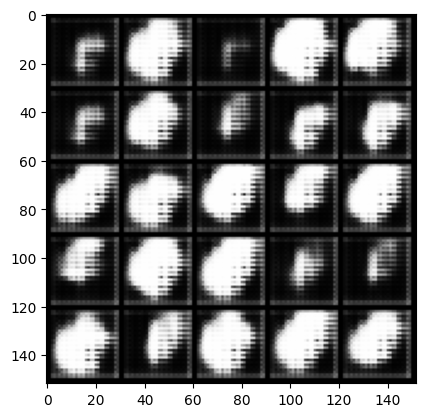

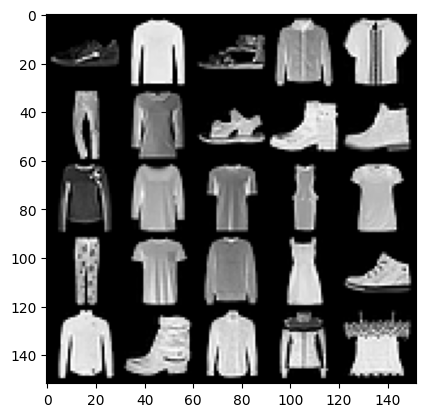

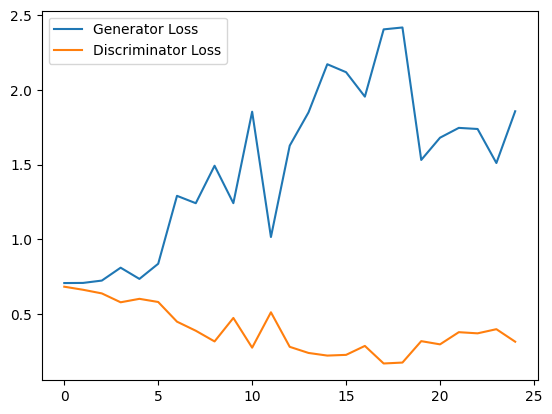

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 2.2575780663490295, discriminator loss: 0.24963101862370968


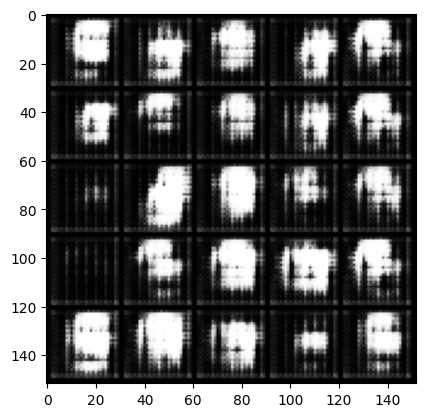

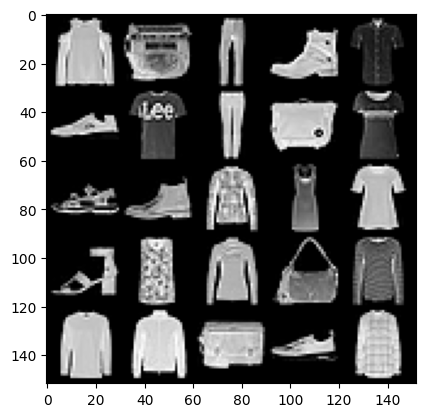

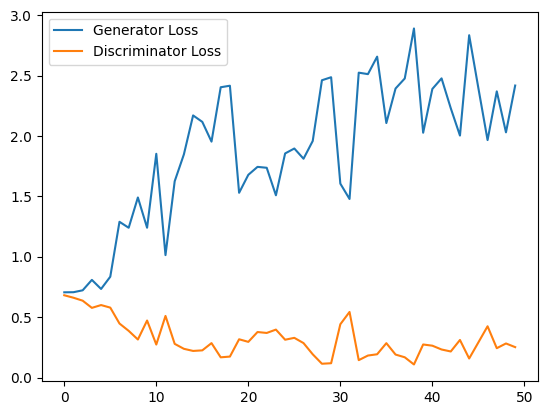

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.180613440990448, discriminator loss: 0.32753636963665483


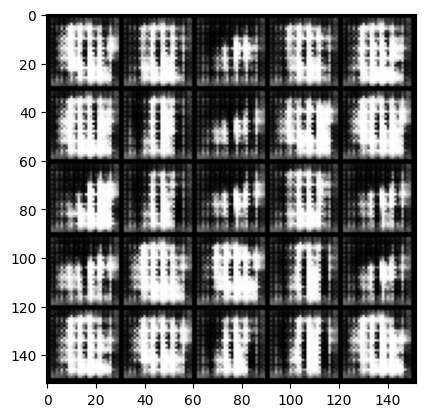

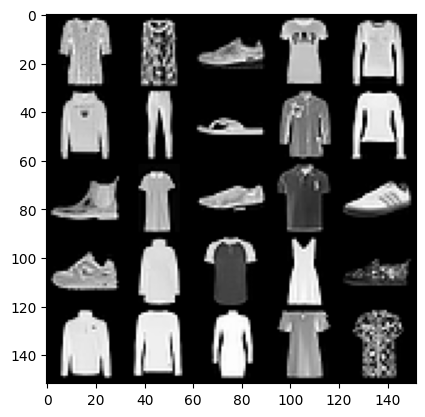

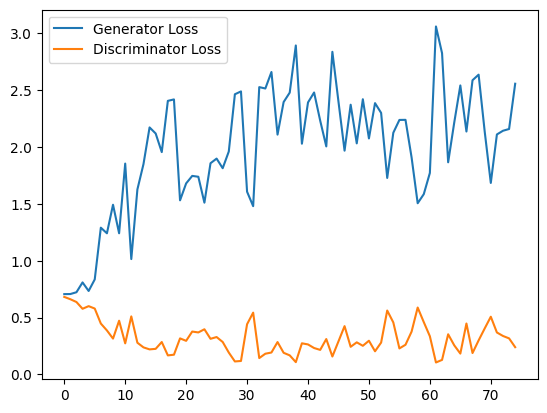

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 2.0903879960775376, discriminator loss: 0.29902852971851823


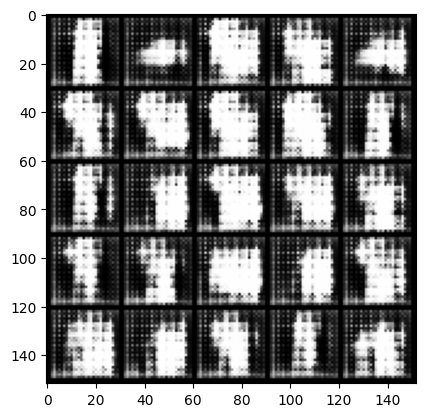

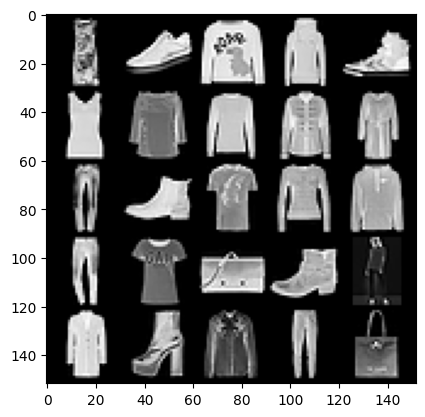

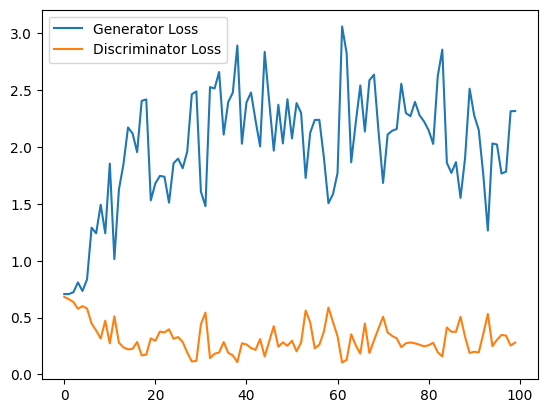

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.9007909007072448, discriminator loss: 0.3849924009293318


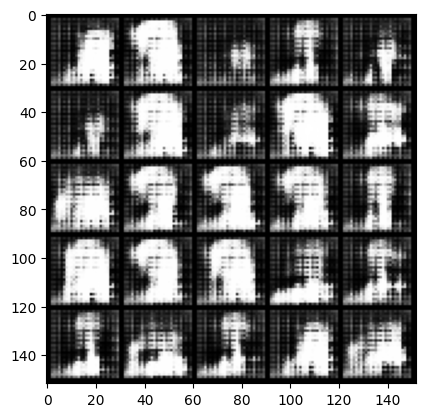

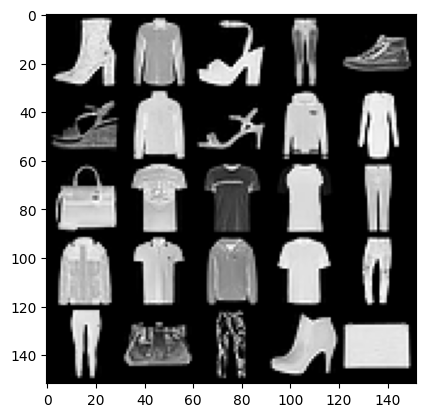

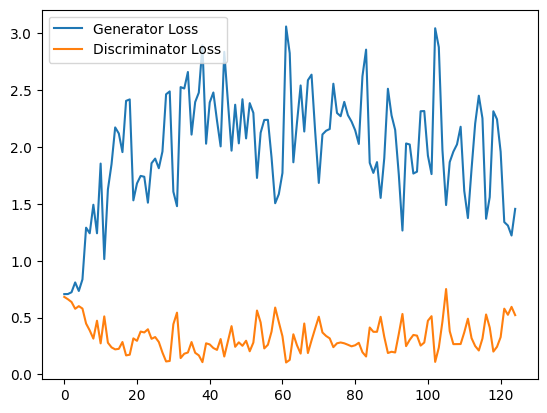

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.6996692879199982, discriminator loss: 0.41631921783089637


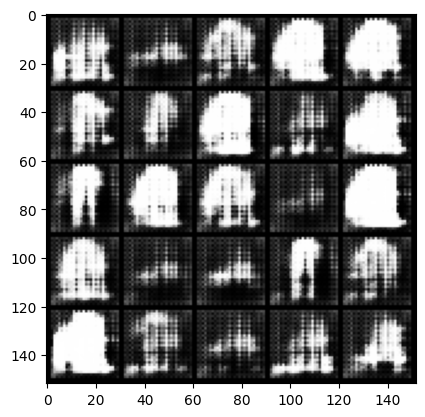

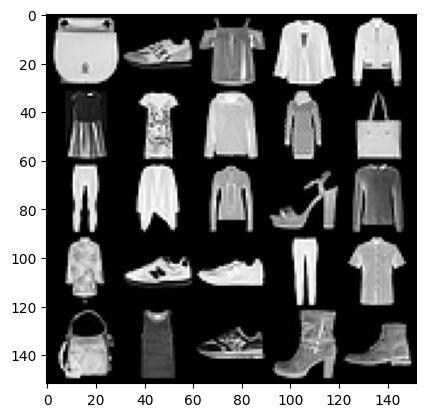

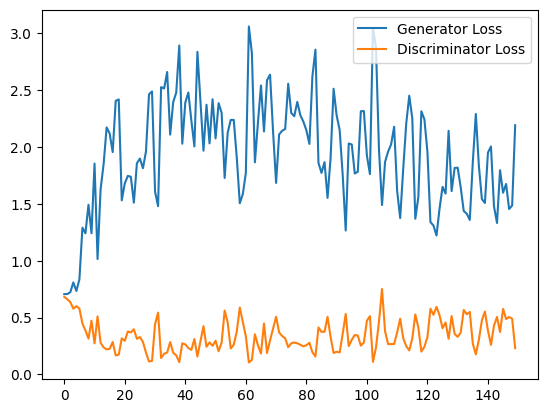

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 1.5513460323810577, discriminator loss: 0.4419351271390915


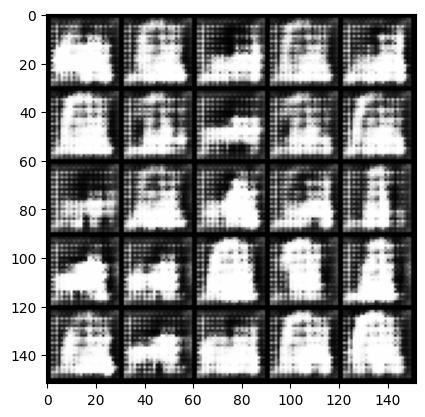

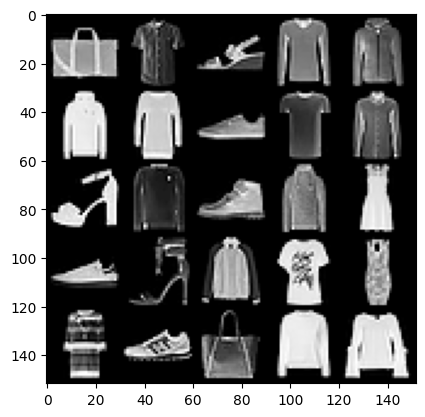

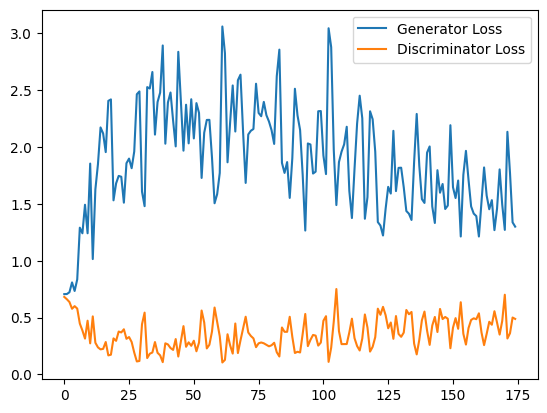

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 1.4475145765542985, discriminator loss: 0.4375177739858627


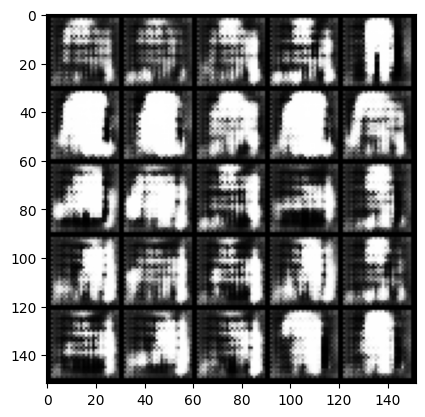

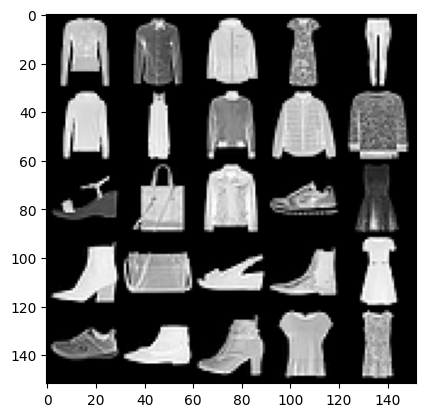

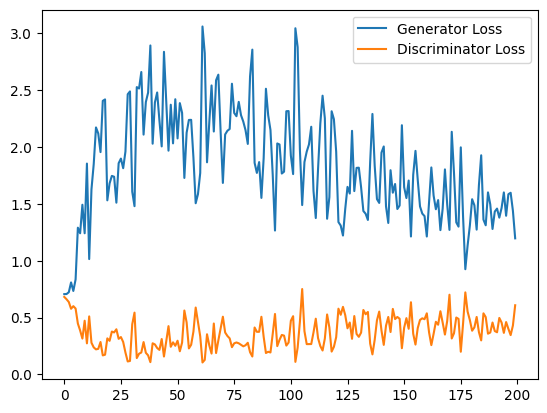

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 1.4757142326831818, discriminator loss: 0.48317439725995065


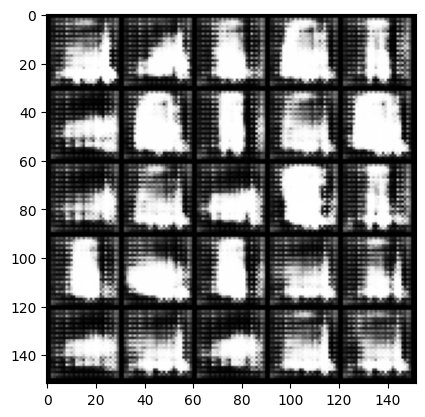

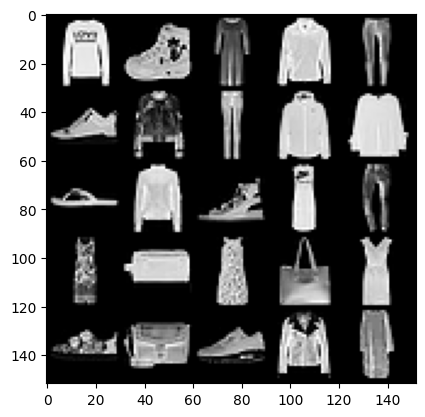

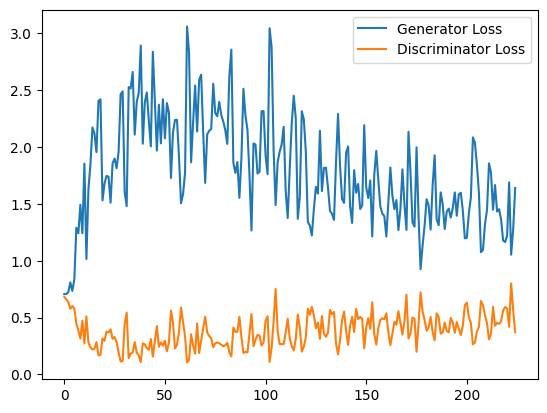

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 1.4523573702573775, discriminator loss: 0.4441282749772072


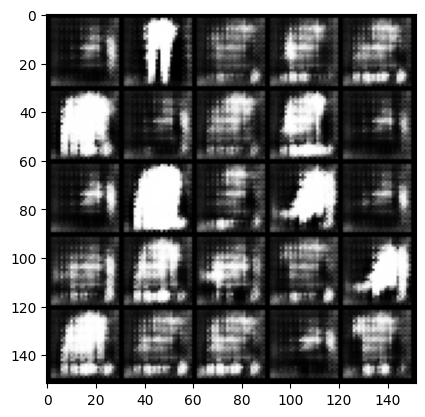

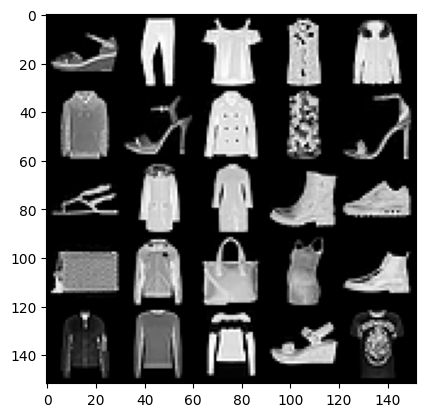

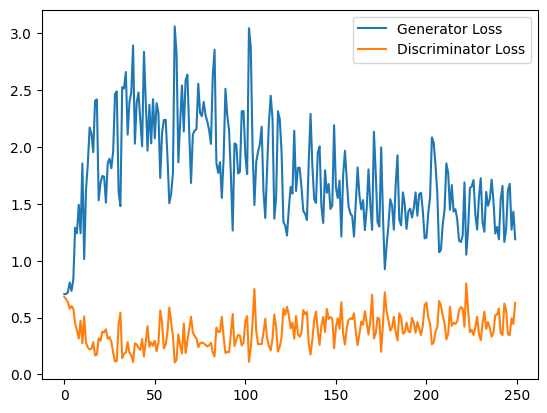

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 1.1925026584863663, discriminator loss: 0.5478710401654243


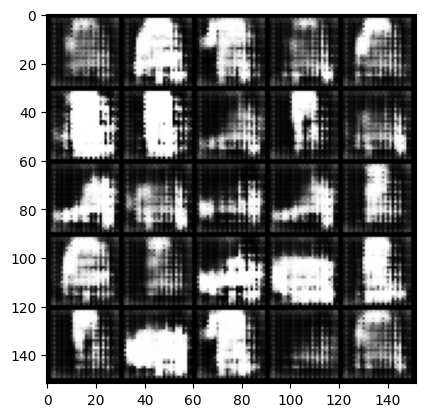

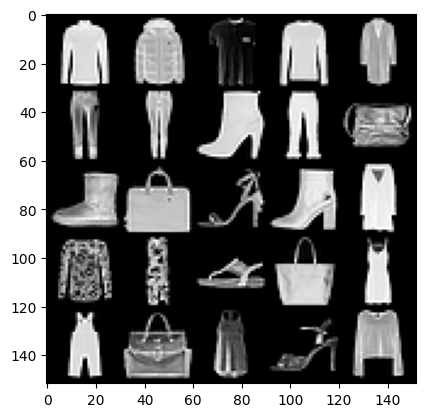

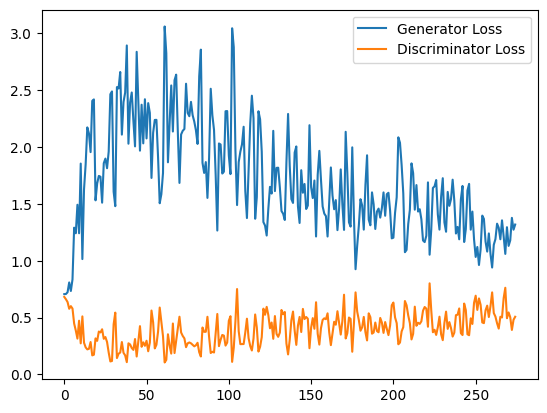

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 1.4411971356868745, discriminator loss: 0.47738851565122603


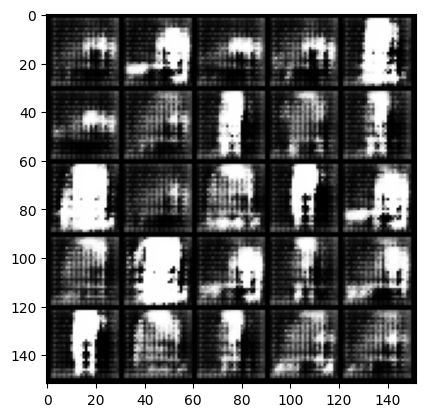

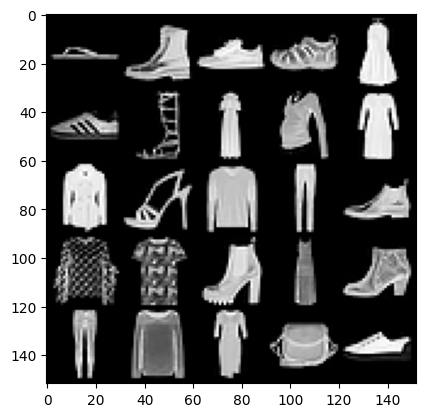

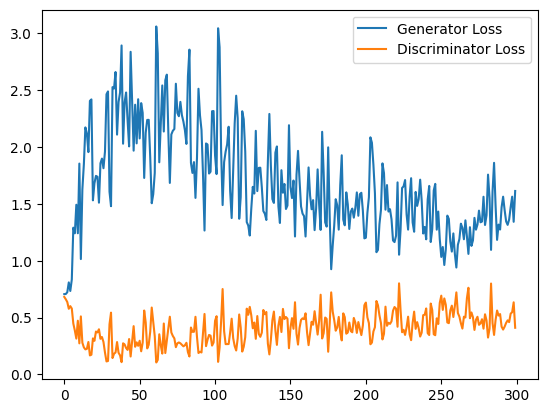

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 1.2692695784568786, discriminator loss: 0.5284913381934166


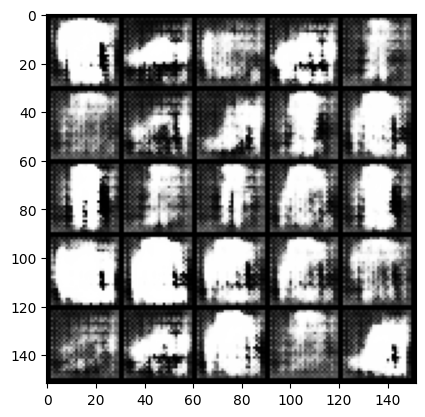

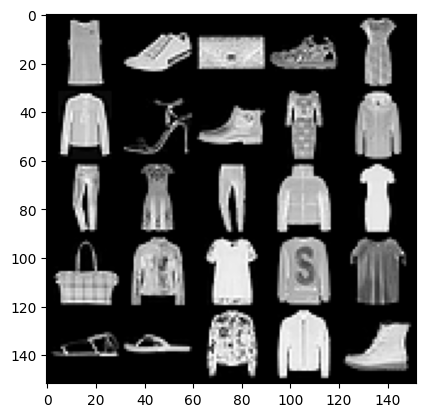

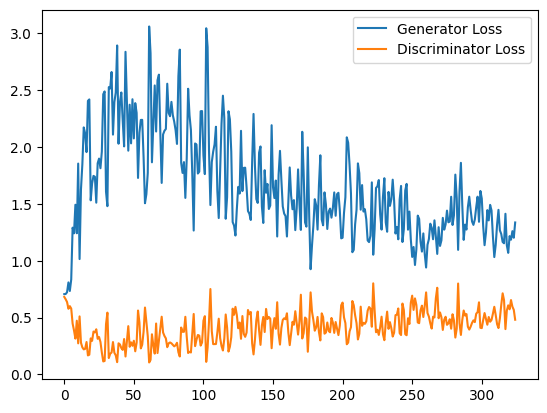

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 1.1499731396436692, discriminator loss: 0.5460763352513314


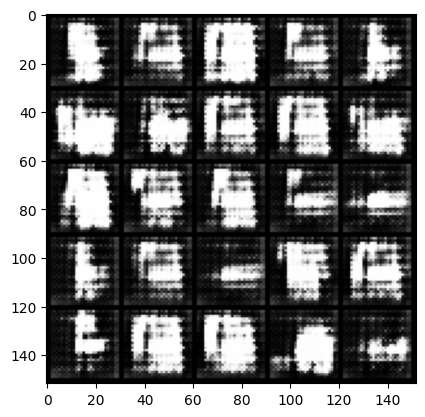

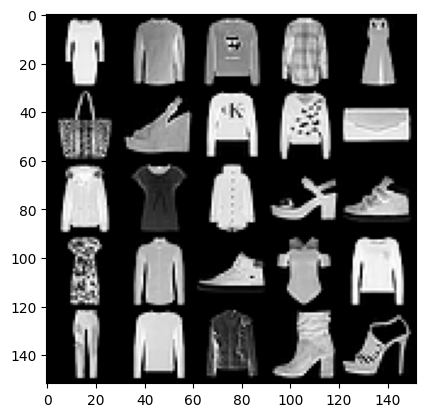

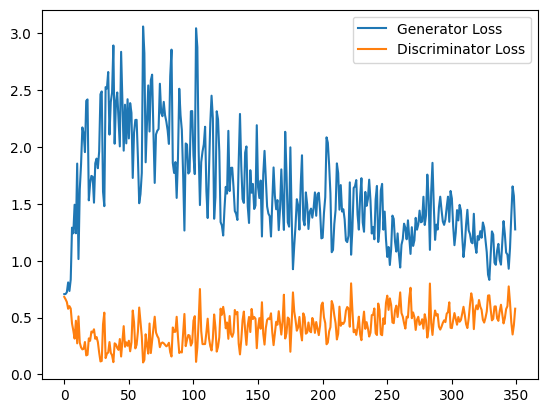

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 1.2694733599424362, discriminator loss: 0.5146489399969578


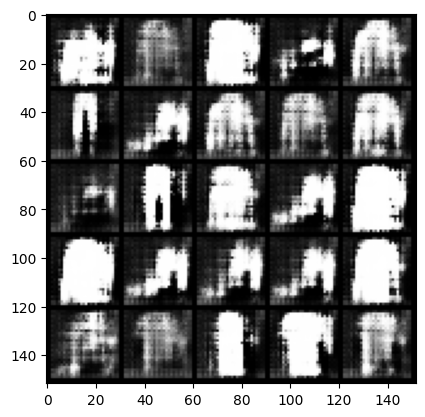

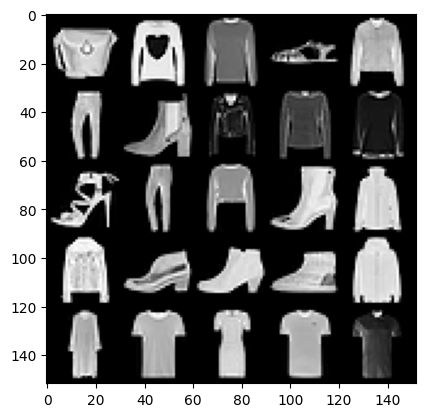

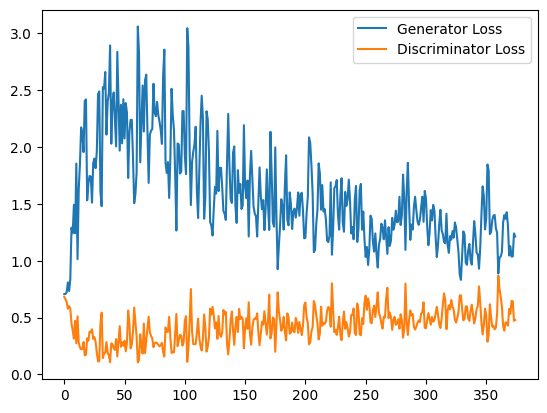

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 1.1262610886096955, discriminator loss: 0.5623633390665055


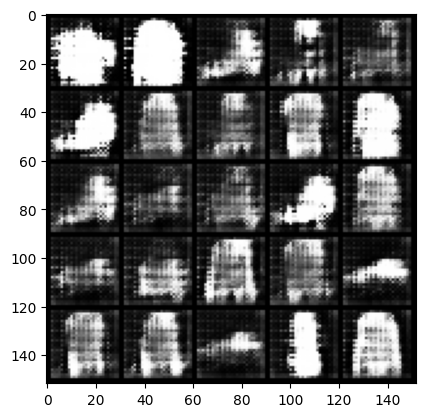

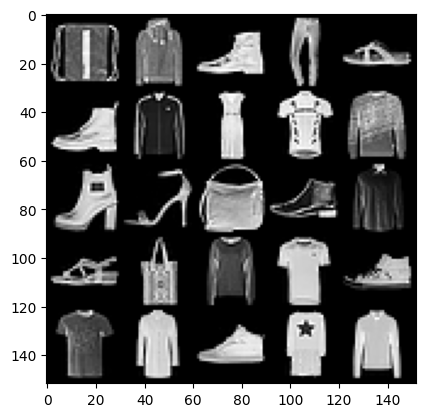

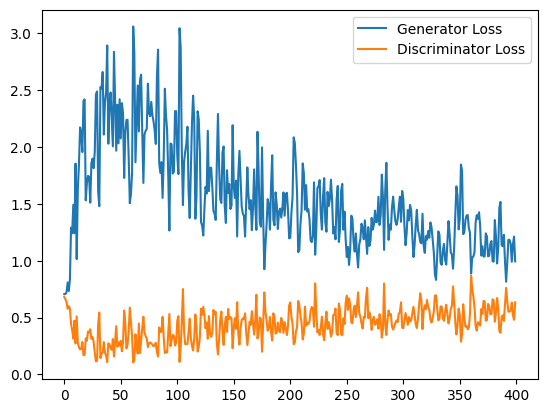

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 1.1670233910083772, discriminator loss: 0.5591926243305206


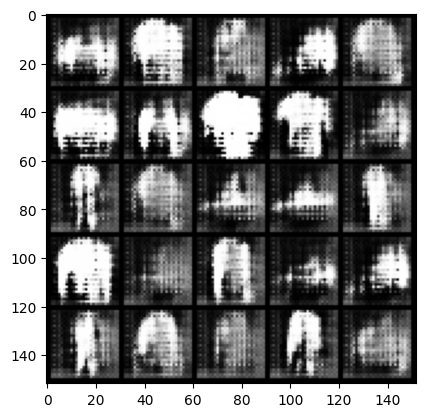

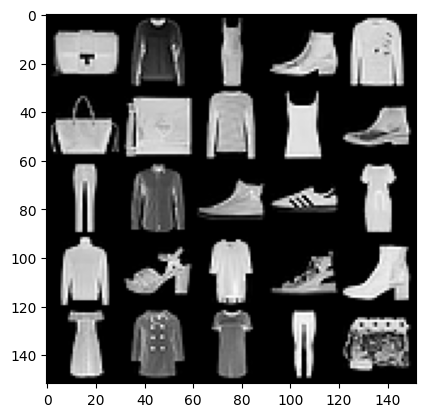

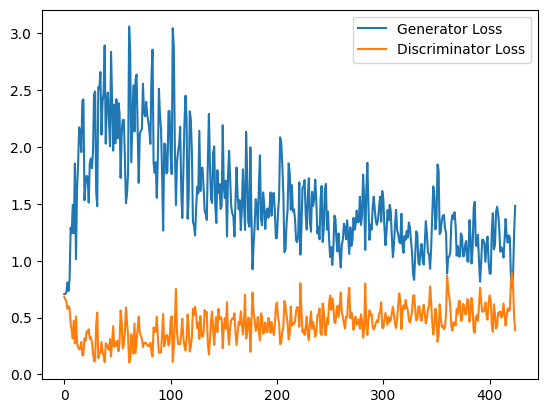

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 1.047877877473831, discriminator loss: 0.6061350709199905


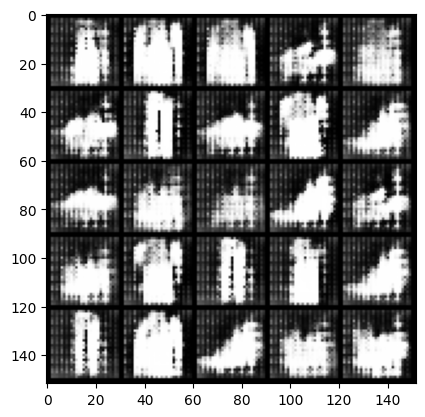

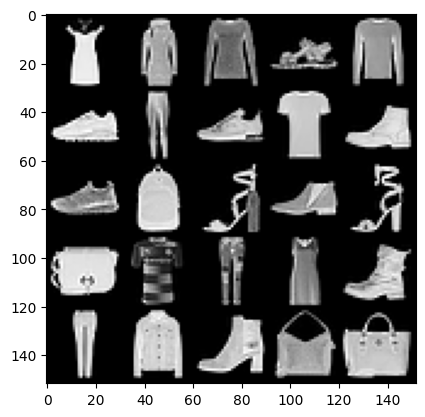

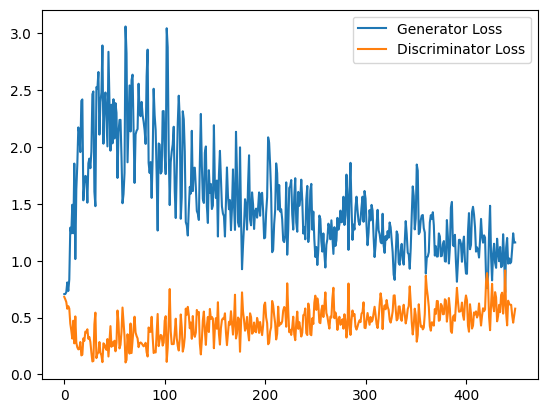

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 1.2653078519105911, discriminator loss: 0.5126038423478604


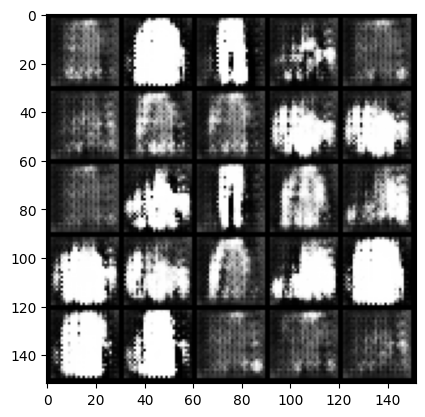

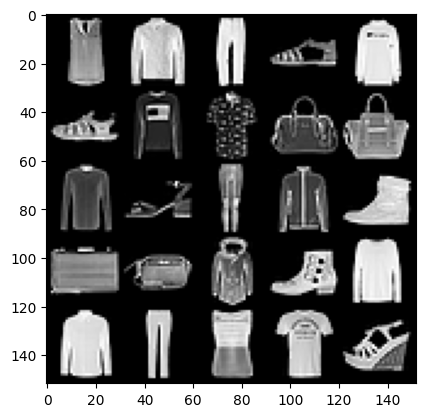

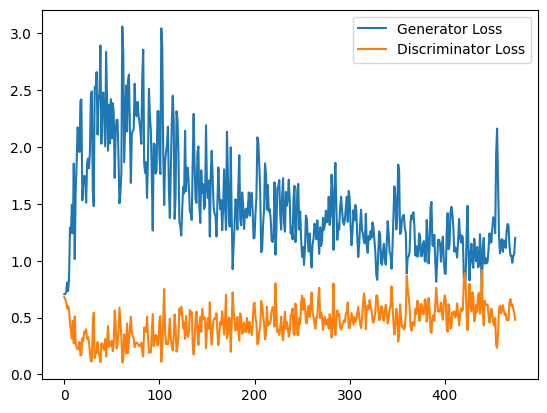

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 1.1368172458410264, discriminator loss: 0.5351160022616387


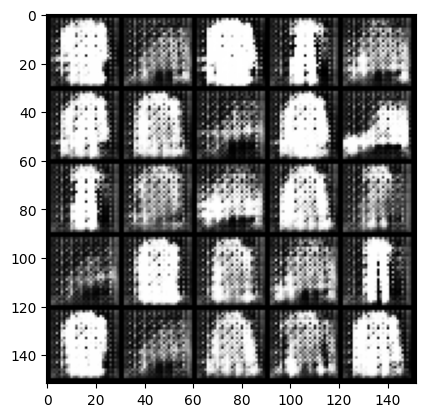

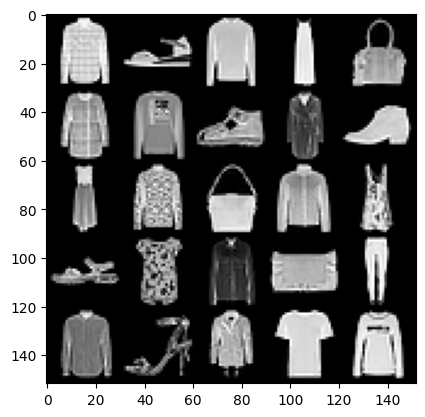

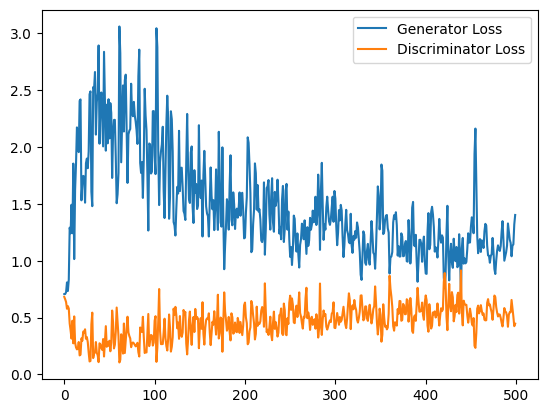

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 1.3124033342599868, discriminator loss: 0.48684156024456027


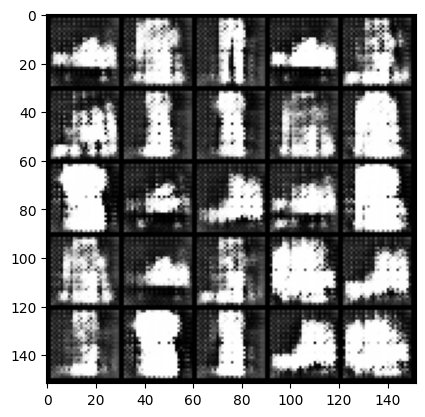

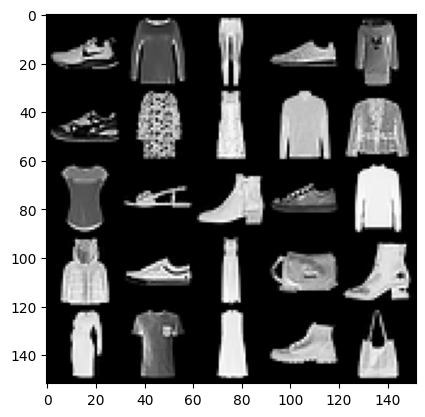

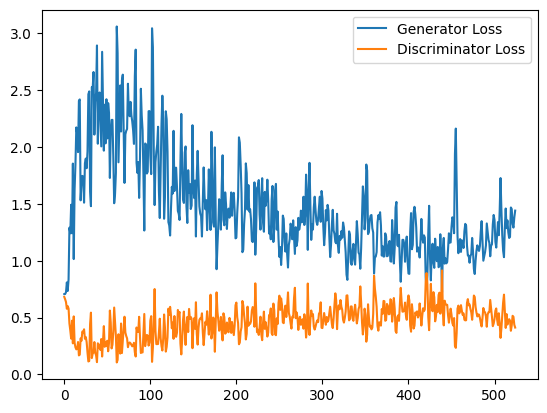

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 1.24799553668499, discriminator loss: 0.5687314881086349


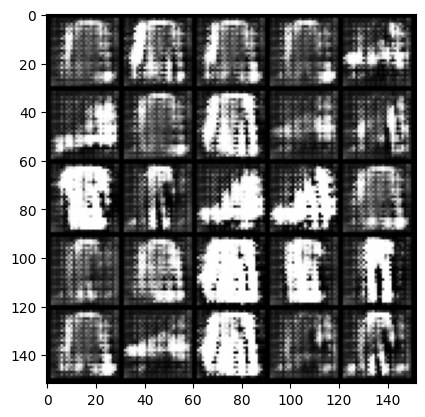

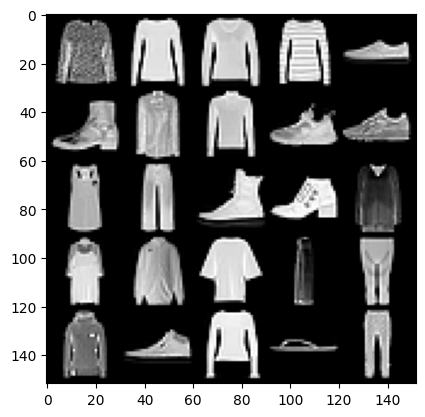

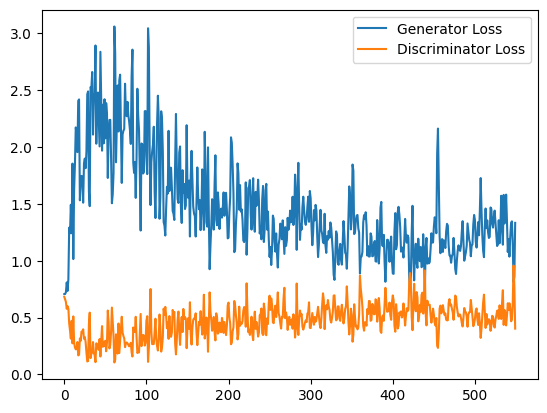

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 1.0816659828424453, discriminator loss: 0.5565219433903694


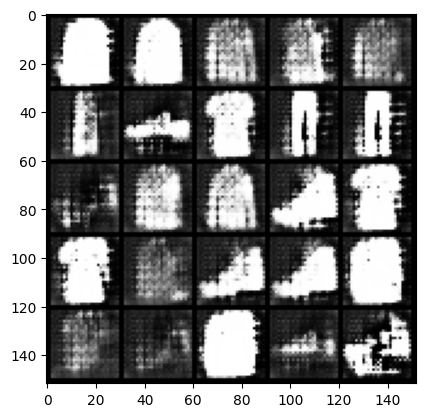

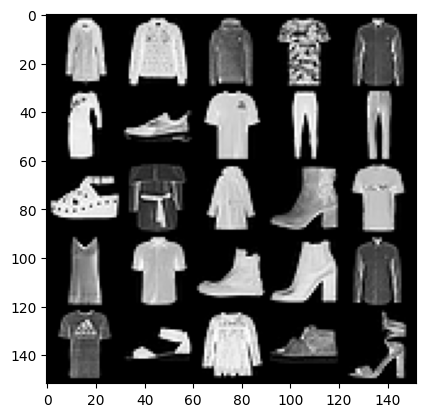

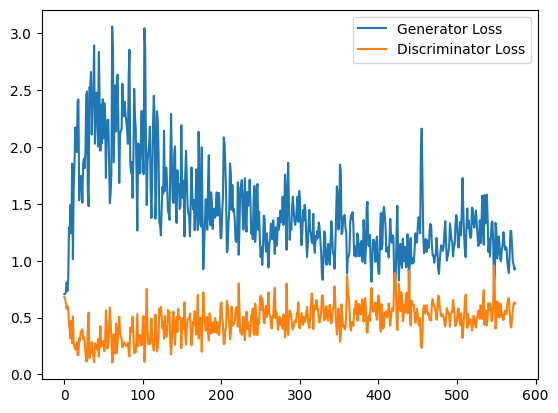

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 0.9492872161865235, discriminator loss: 0.63287685328722


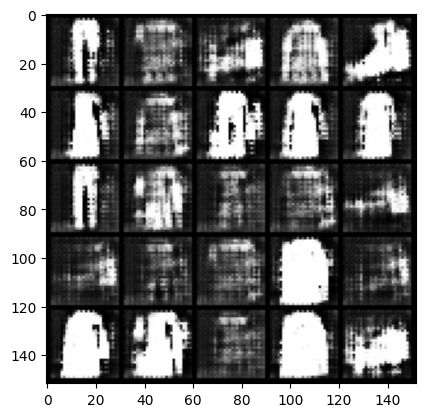

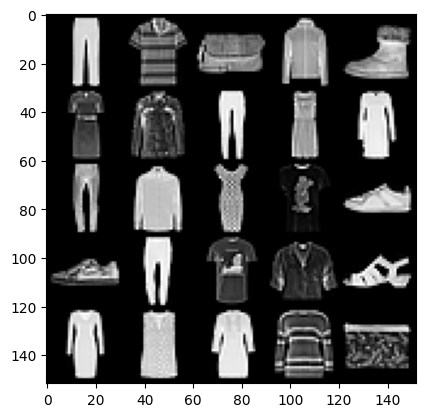

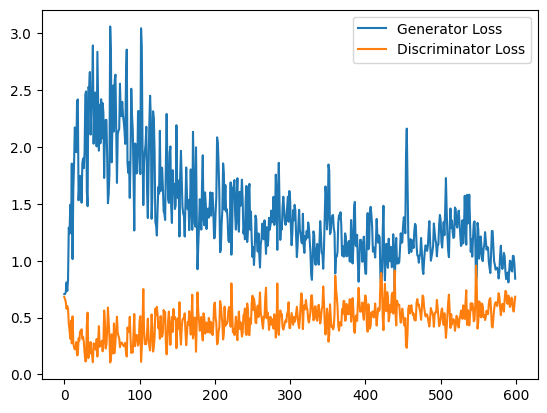

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 1.0225625077486038, discriminator loss: 0.5831018391251565


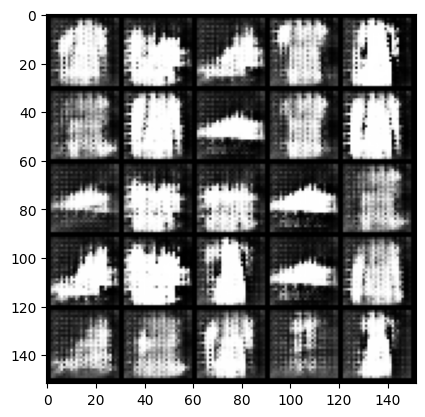

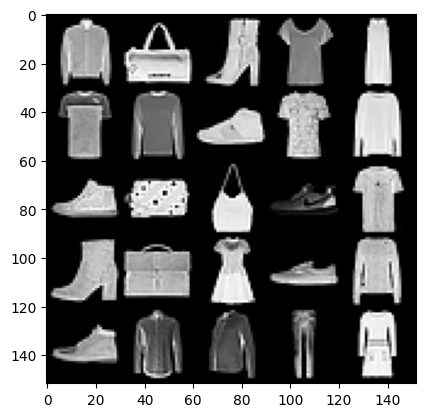

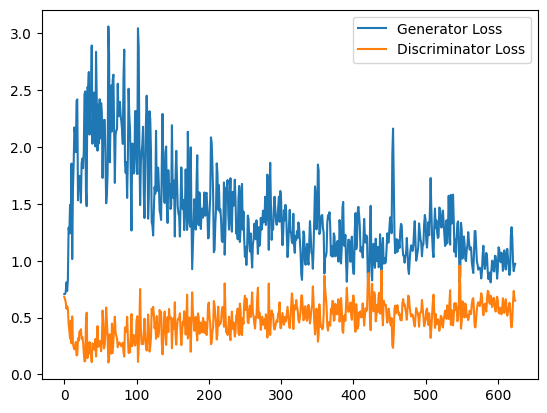

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 1.1852907110452653, discriminator loss: 0.5370974224805832


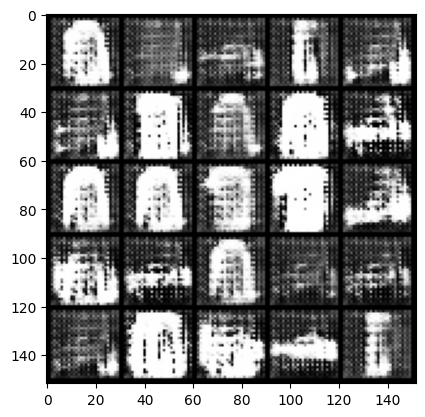

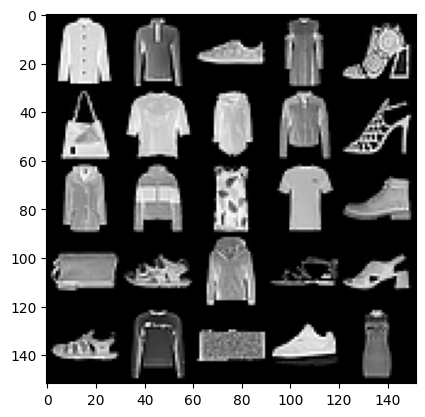

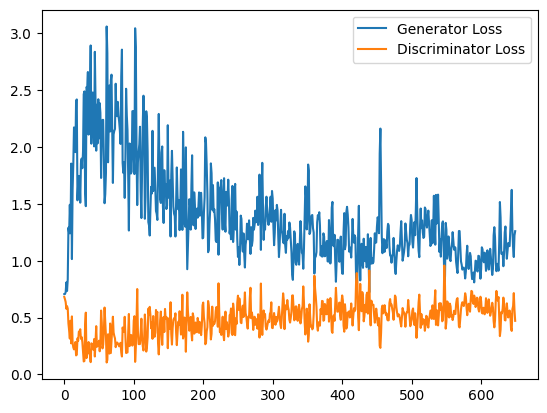

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 1.2412601571083068, discriminator loss: 0.5333504582643509


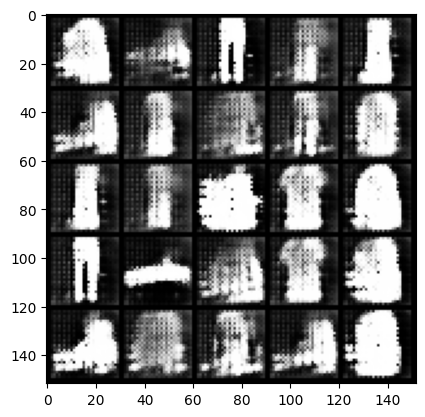

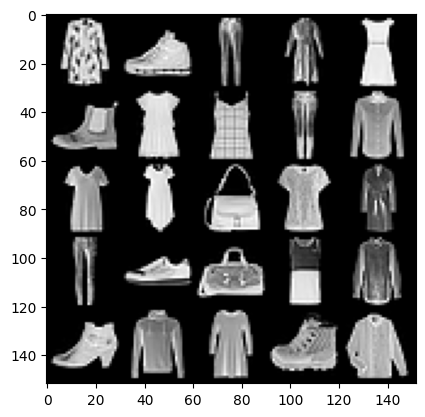

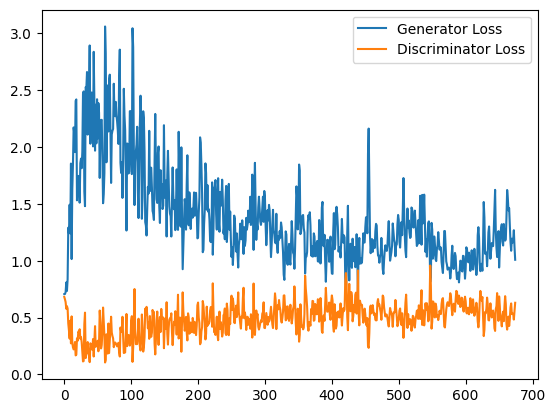

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 1.1836363204717637, discriminator loss: 0.5367477658987045


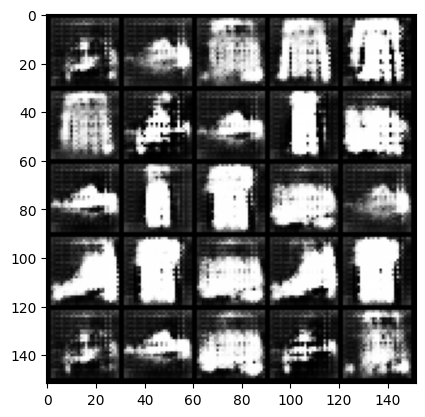

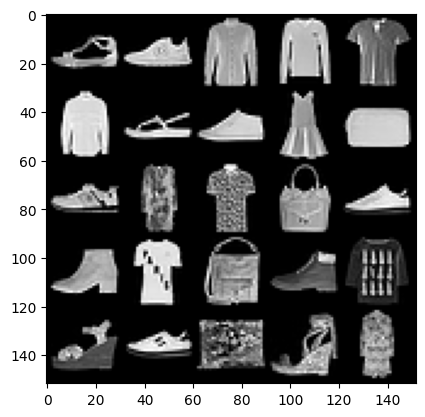

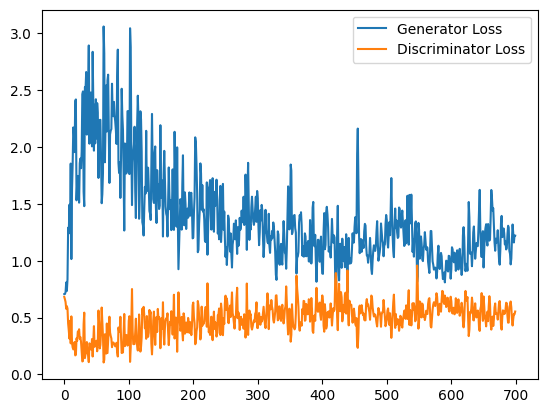

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 1.0856339991092683, discriminator loss: 0.5767600710391998


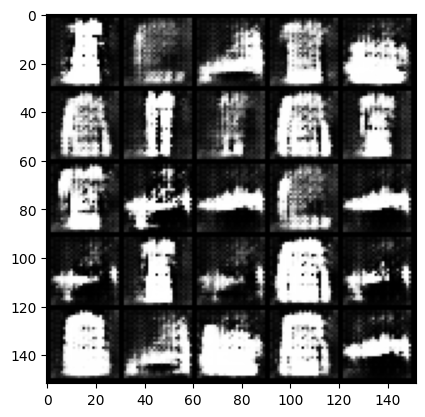

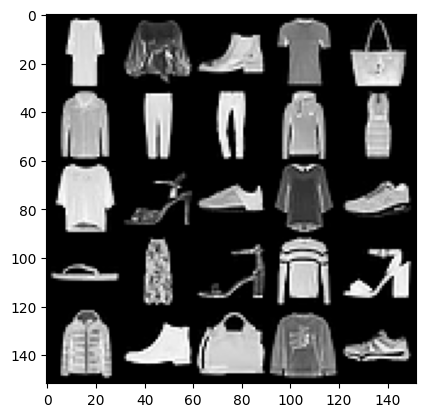

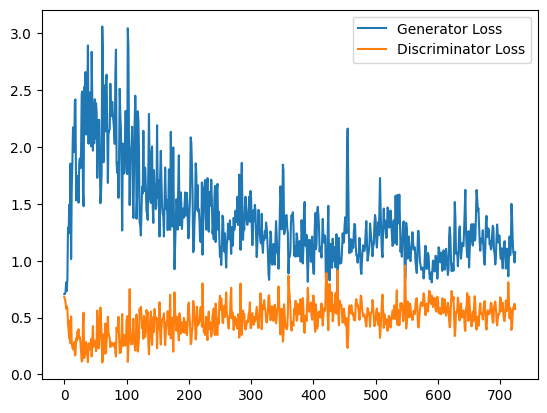

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 1.0846036002635955, discriminator loss: 0.5893788168430328


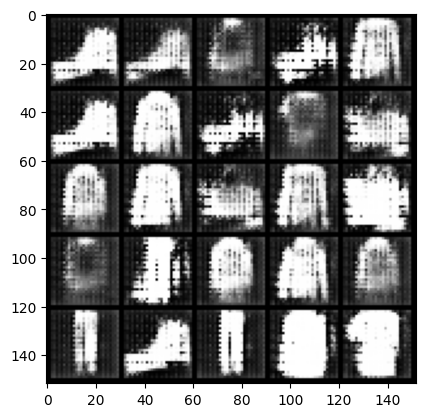

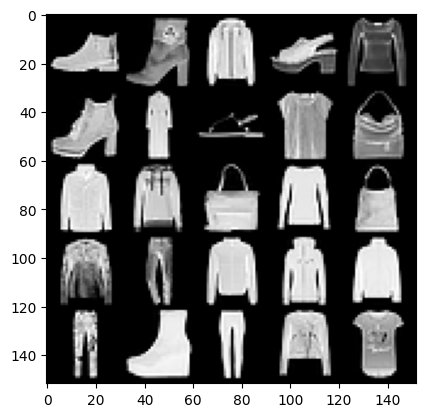

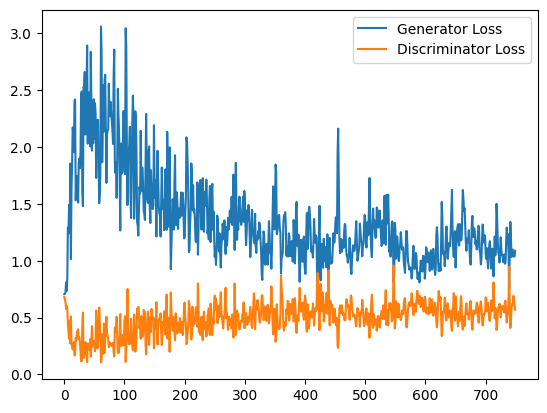

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 1.0766925159692764, discriminator loss: 0.5674378610849381


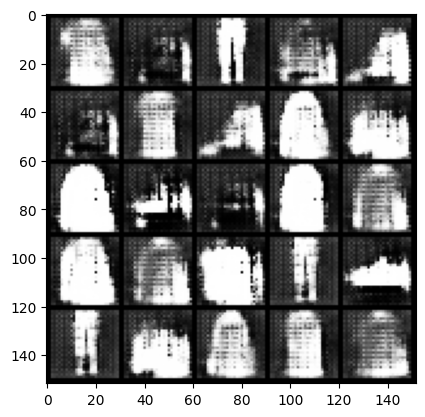

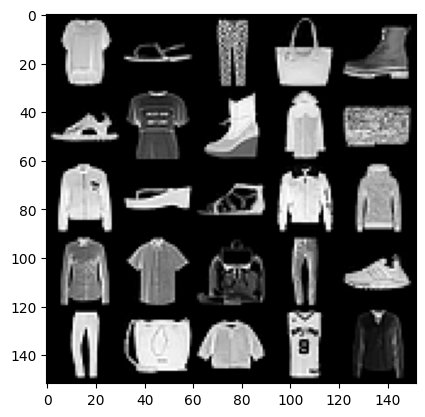

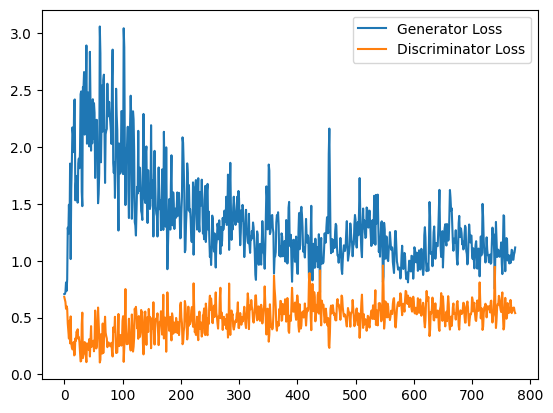

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 1.0674692653417588, discriminator loss: 0.5732003070116043


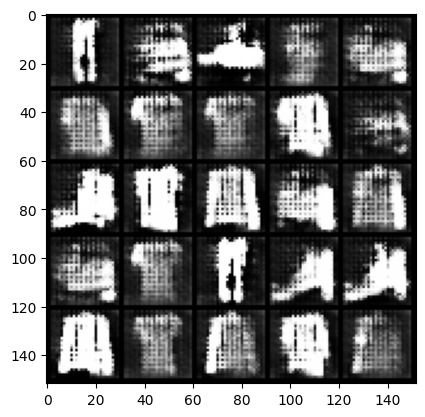

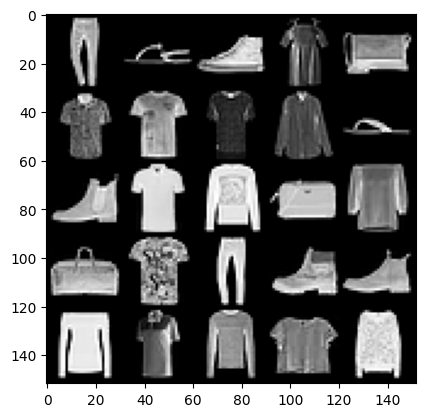

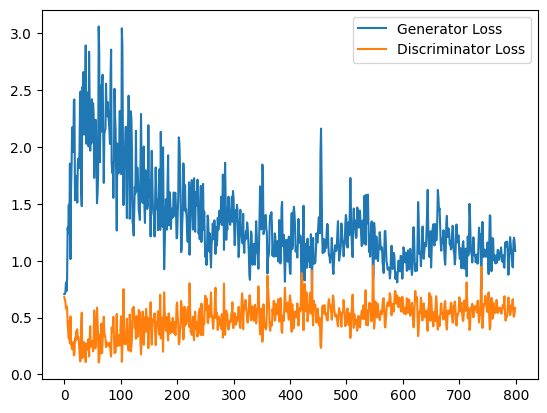

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 1.1007125816345216, discriminator loss: 0.5598220479488373


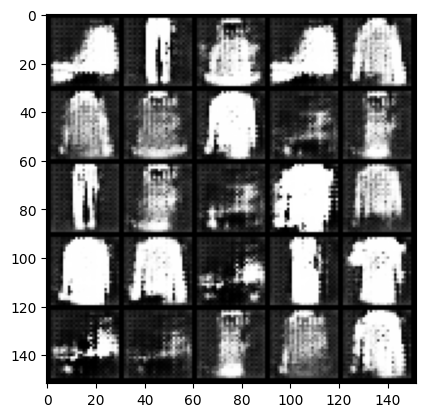

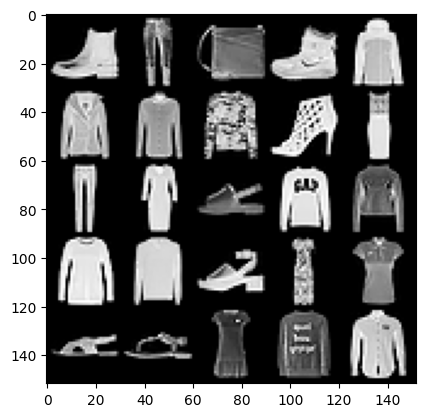

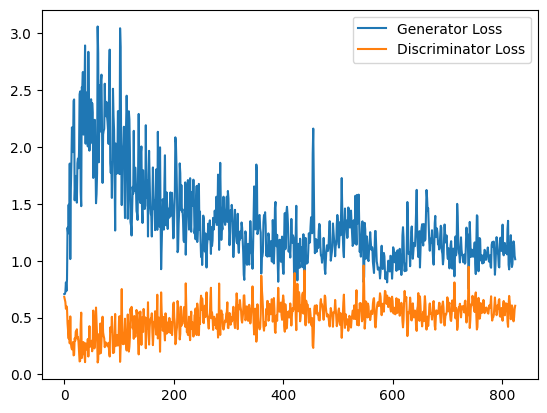

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 1.050529515504837, discriminator loss: 0.5707936714291573


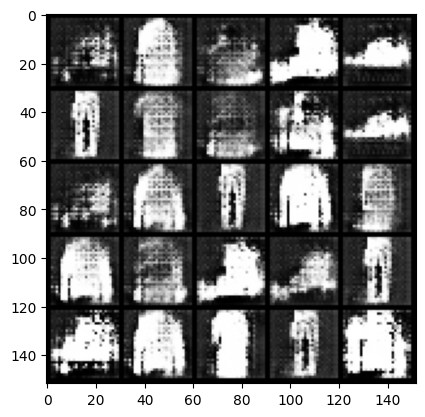

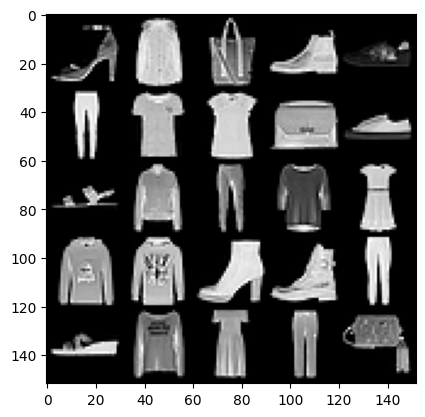

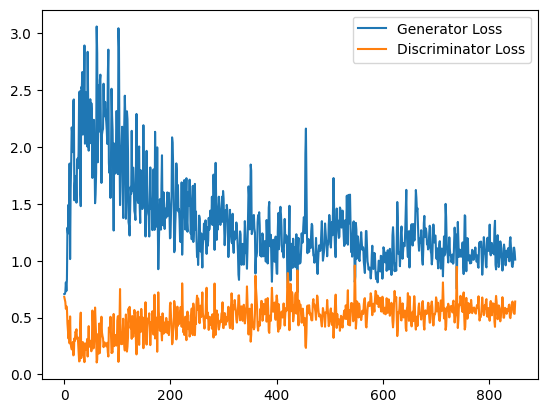

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 1.1204032204151153, discriminator loss: 0.5429007879495621


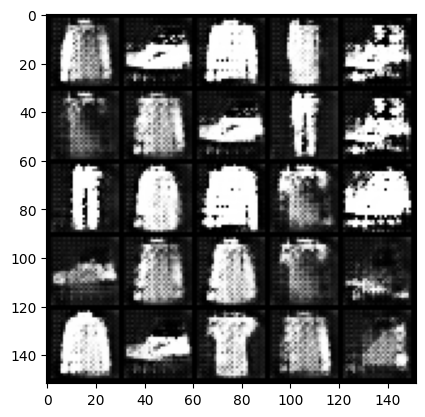

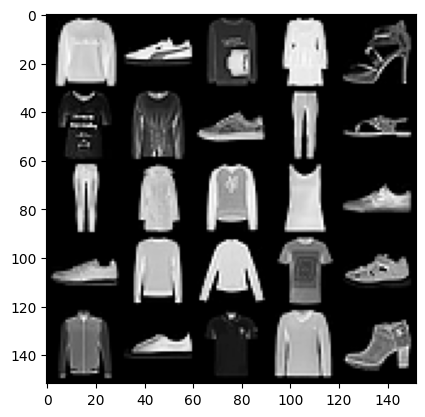

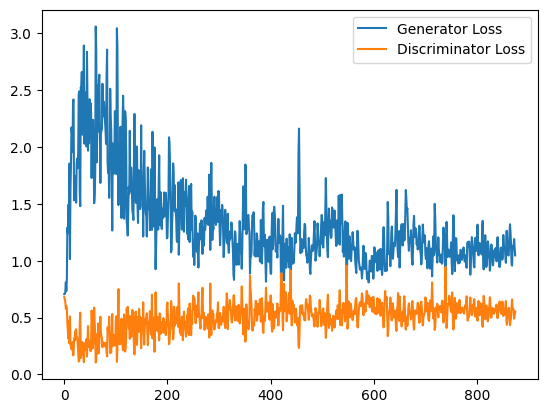

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 1.1570293176174165, discriminator loss: 0.5443138134479523


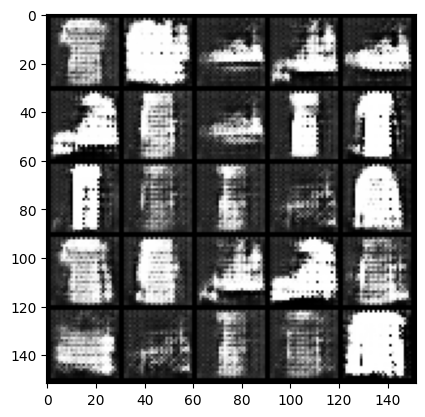

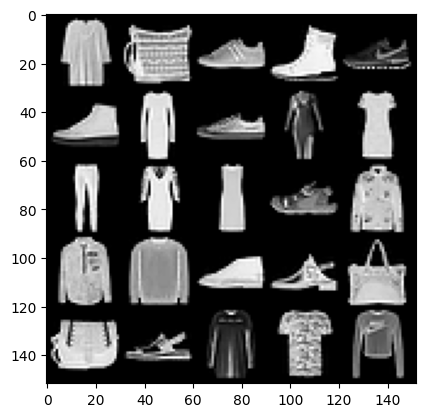

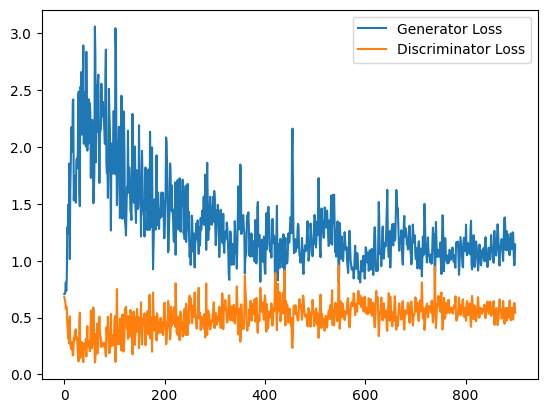

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 1.1097303903102875, discriminator loss: 0.5464724513888359


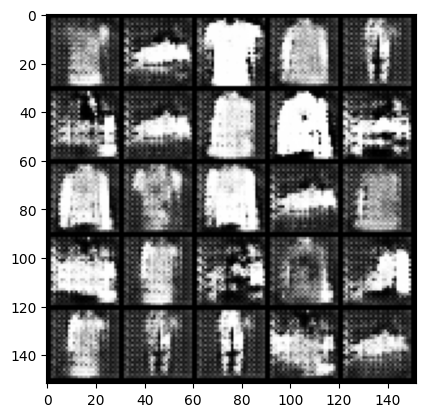

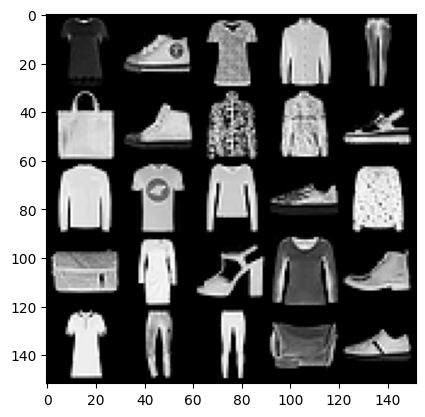

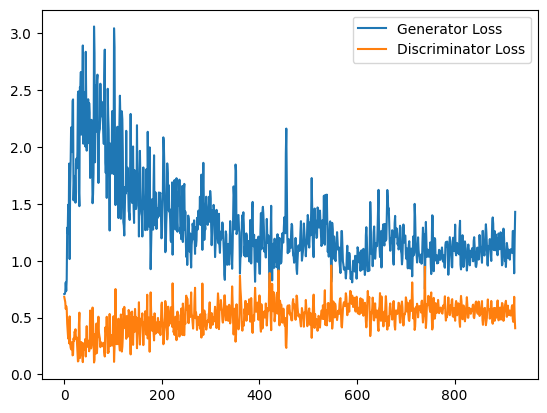

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 1.0671191943883895, discriminator loss: 0.5914817531704902


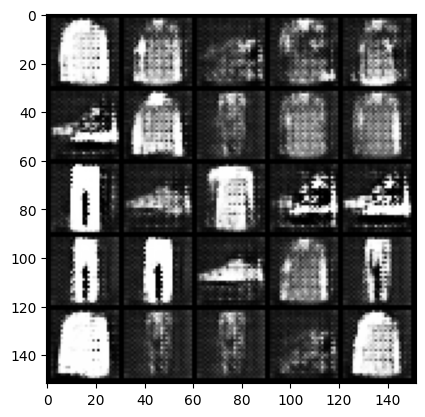

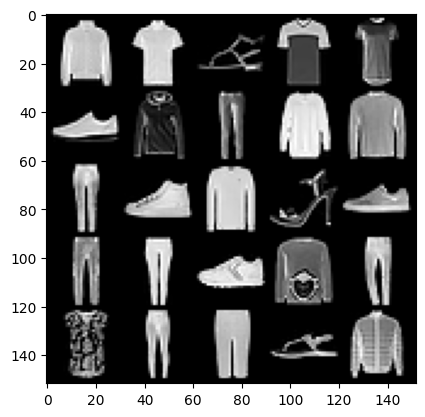

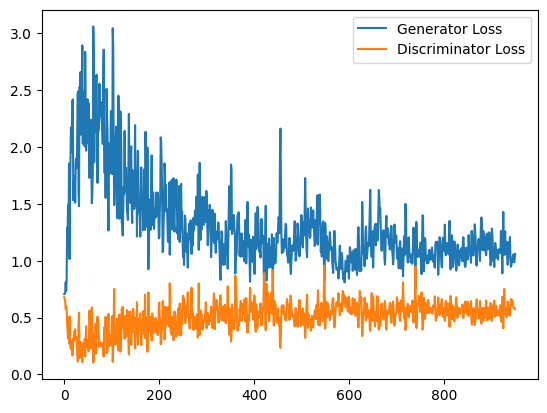

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 1.029679874897003, discriminator loss: 0.578967656314373


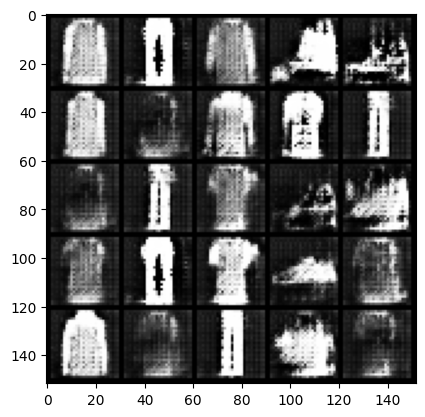

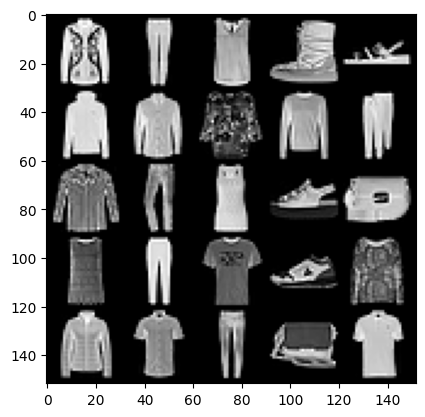

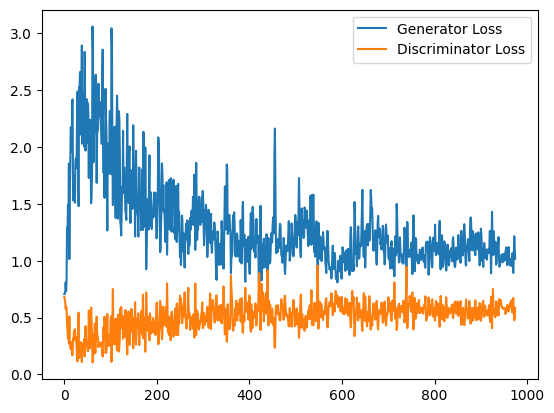

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 0.9778992540836334, discriminator loss: 0.6208048377633095


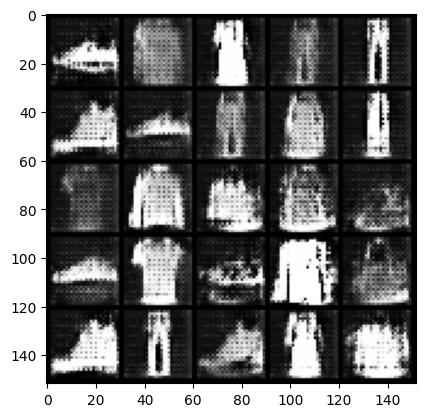

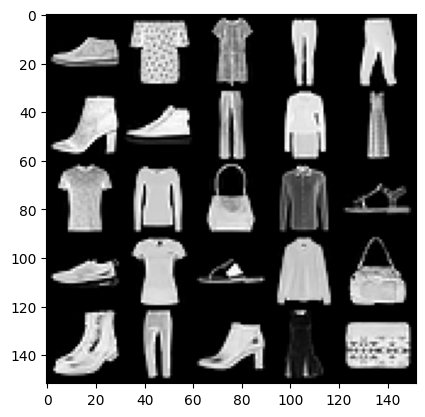

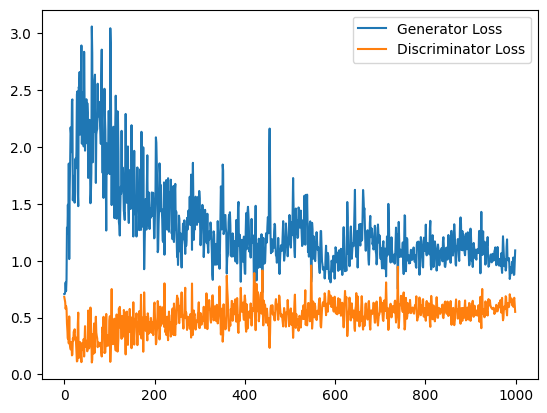

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 0.9855330351591111, discriminator loss: 0.6158789302706719


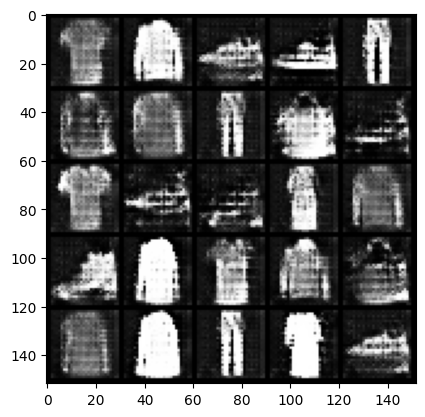

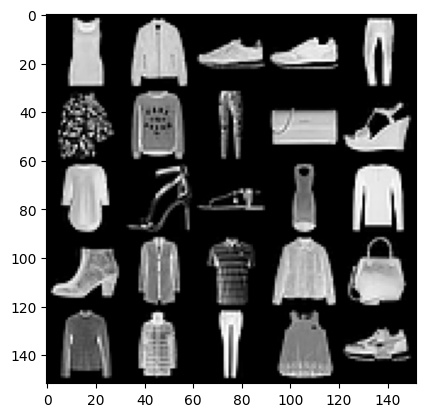

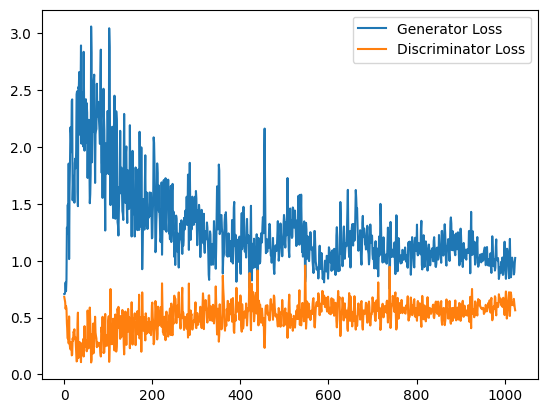

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 0.9731294337511063, discriminator loss: 0.6184687571525573


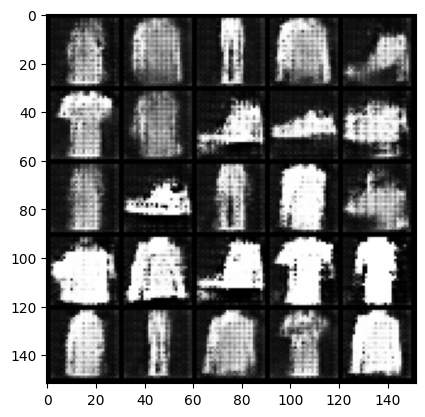

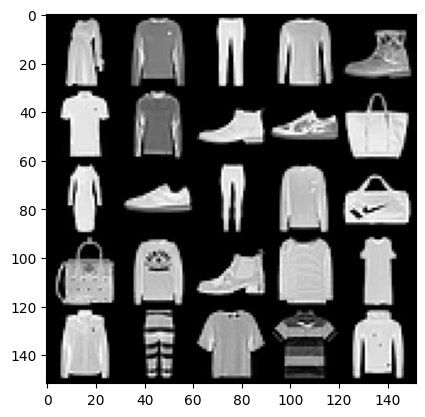

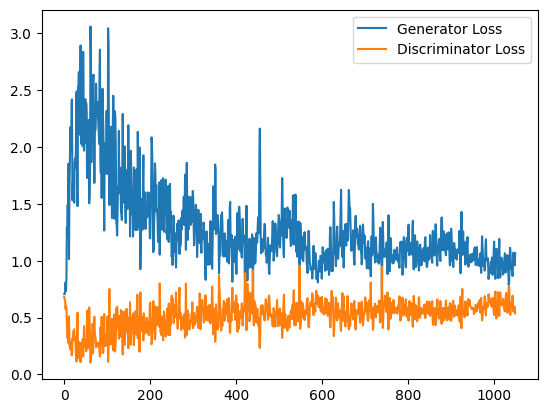

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 0.9357221194505692, discriminator loss: 0.633610922396183


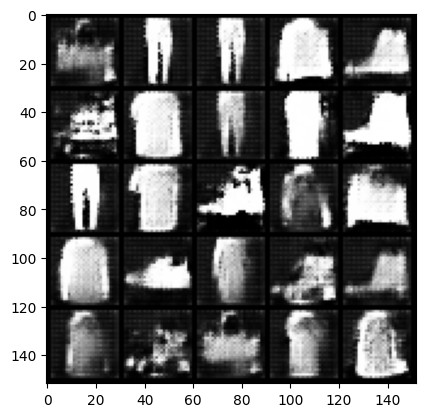

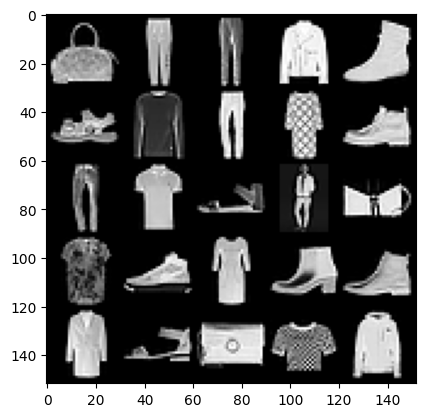

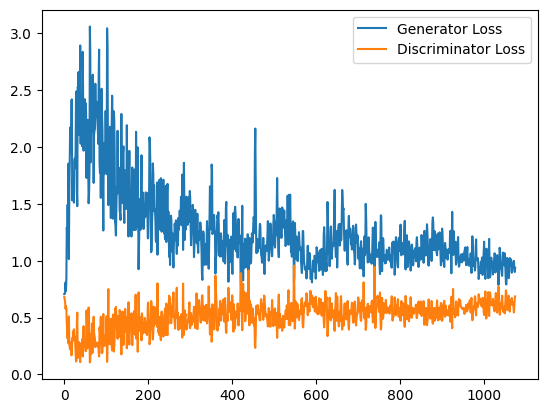

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 0.9230995637178421, discriminator loss: 0.6307003198862076


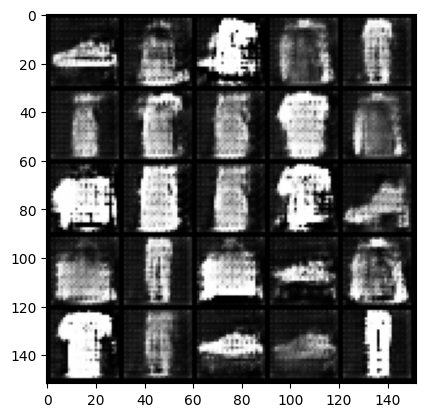

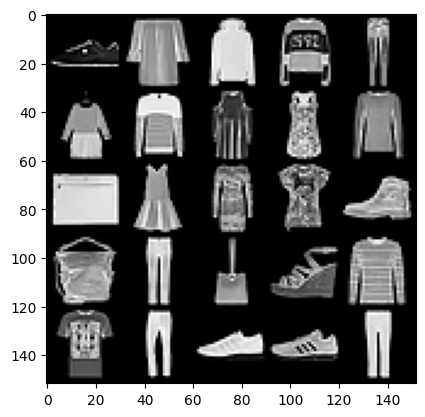

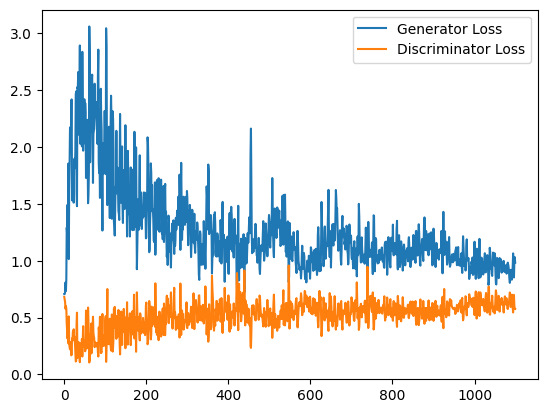

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 0.9493218772411346, discriminator loss: 0.6293702931404114


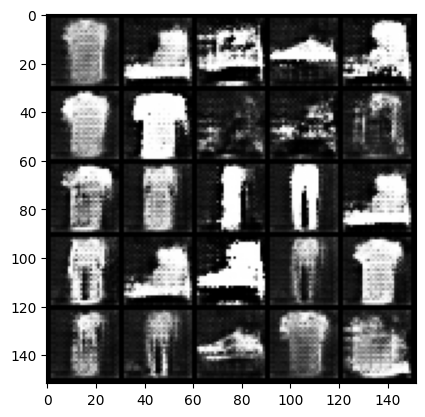

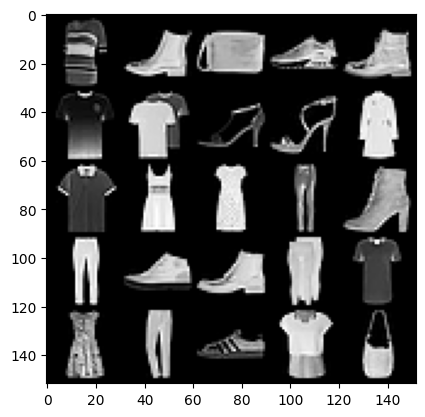

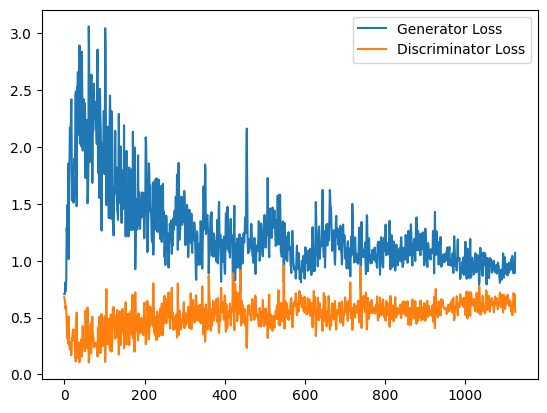

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 0.9306175198554992, discriminator loss: 0.6351156372427941


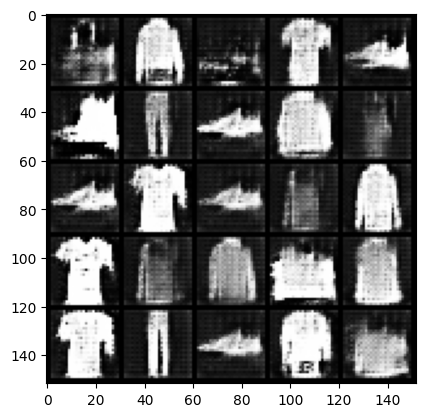

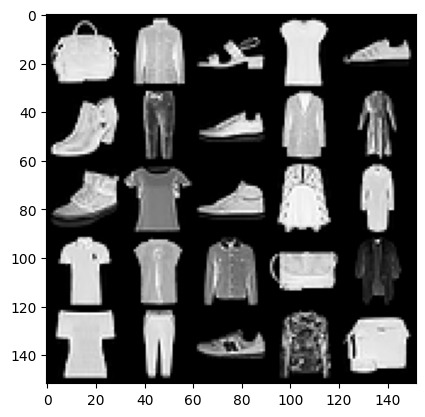

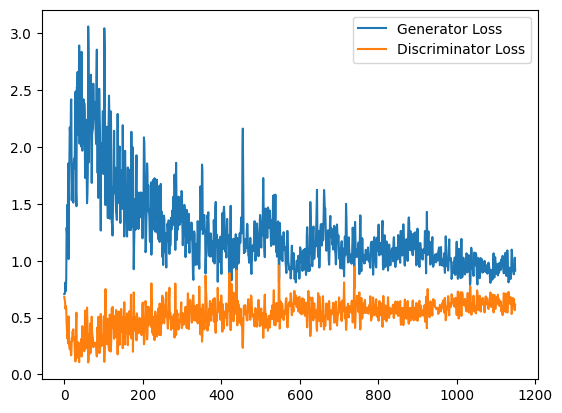

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 0.8996718053817749, discriminator loss: 0.6498283076286316


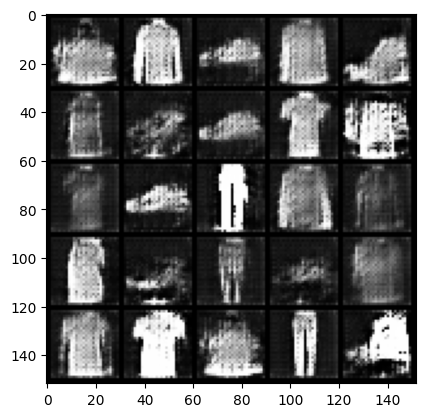

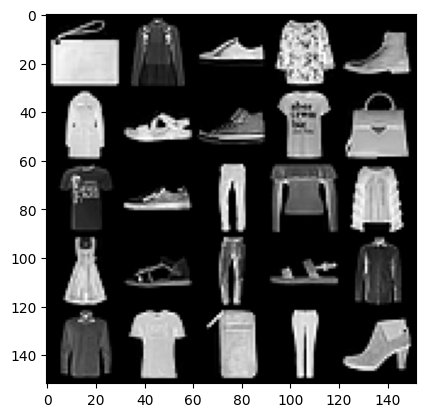

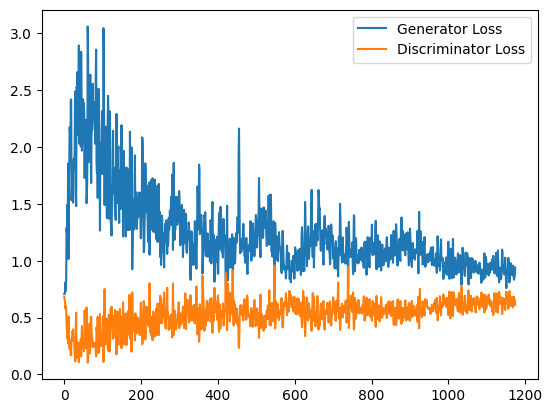

In [ ]:
cur_step = 0
generator_losses = []
discriminator_losses = []

noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)


        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)

        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        cur_step += 1